In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
from torchvision import models
from torch.autograd import Variable
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

from torch import nn
import torch

In [2]:
from scipy.ndimage.filters import gaussian_filter

In [3]:
resnet = models.resnet50(pretrained=True)

In [4]:
import sys
sys.path.insert(0, '..')
from AttentionModule import Conv2d_Attn


In [5]:
attn_model = torch.load('resnet50-l2-out-attn.pth')

In [6]:
import torchvision.transforms as transforms
import torchvision
batch_size = 32
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
transform = transforms.Compose(
    [transforms.ToTensor(),
     normalize])

trainset = torchvision.datasets.ImageFolder(root='../data/train', transform=transform)

In [7]:
import random
random.shuffle(trainset.imgs)

In [8]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=False, num_workers=2)

In [9]:
_, max_idx = (attn_model.layer4[2].conv1.attn_weights.squeeze()).sum(1).topk(3)
max_idx = max_idx.data.cpu().numpy()
max_idx

array([438, 355, 510])

In [10]:
childs = list(resnet.children())

In [11]:
to_conv = nn.Sequential(
    *(childs[:7] 
      + list(childs[7].children())[:2] 
      + [list(childs[7].children())[2].conv1]))

In [12]:
to_conv = to_conv.eval().cuda()

In [13]:
max_iter = 50
all_act = []
for i, (input, _) in enumerate(trainloader):
    out = to_conv(Variable(input).cuda())
    act = out[:,max_idx]
    all_act.append(act.data)
    if i > max_iter:
        break

In [14]:
all_act[0].shape

torch.Size([32, 3, 7, 7])

In [15]:
all_act = torch.cat(all_act)

In [16]:
all_act.shape

torch.Size([1664, 3, 7, 7])

In [17]:
filt_25 = all_act[:,0,...]

In [18]:
l1_norms = np.array([filt_25[i].norm(p=1) for i in range(len(all_act))])

In [19]:
import PIL

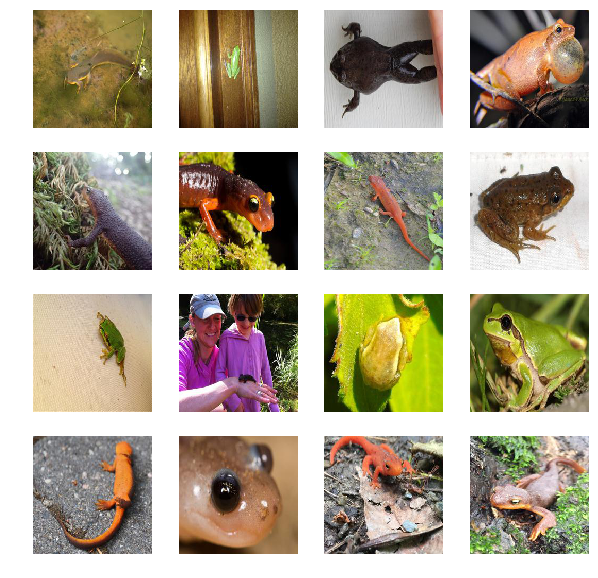

In [20]:
plt.figure(figsize=(10,10))
for i, idx in enumerate(np.argsort(l1_norms)[-16:]):
    plt.subplot(4,4,i+1)
    plt.imshow(PIL.Image.open(trainset.imgs[idx][0]))
    plt.axis('off')

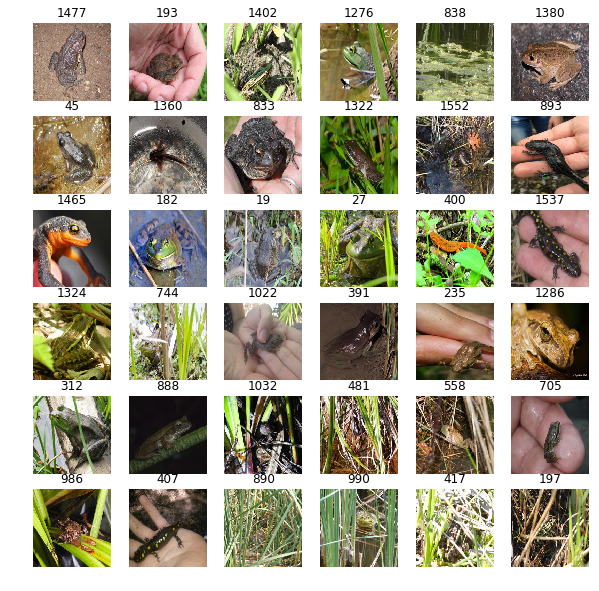

In [71]:
filt_43 = all_act[:,1,...]
l1_norms = np.array([filt_43[i].norm(p=2) for i in range(len(all_act))])
plt.figure(figsize=(10,10))
for i, idx in enumerate(np.argsort(l1_norms)[-36:]):
    plt.subplot(6,6,i+1)
    plt.title(idx)
    plt.imshow(PIL.Image.open(trainset.imgs[idx][0]))
    plt.axis('off')

../data/train/2648/56f5b35b2183adbe111ac50cf5955df8.jpg
../data/train/2659/d524808402d43a174415fb2fd9bb0d7b.jpg
../data/train/2679/b67c4424ea5424682f40ec224d803e1c.jpg
../data/train/2684/b8502e941586cf48263d885f30925810.jpg
Visualization res5c_branch2a


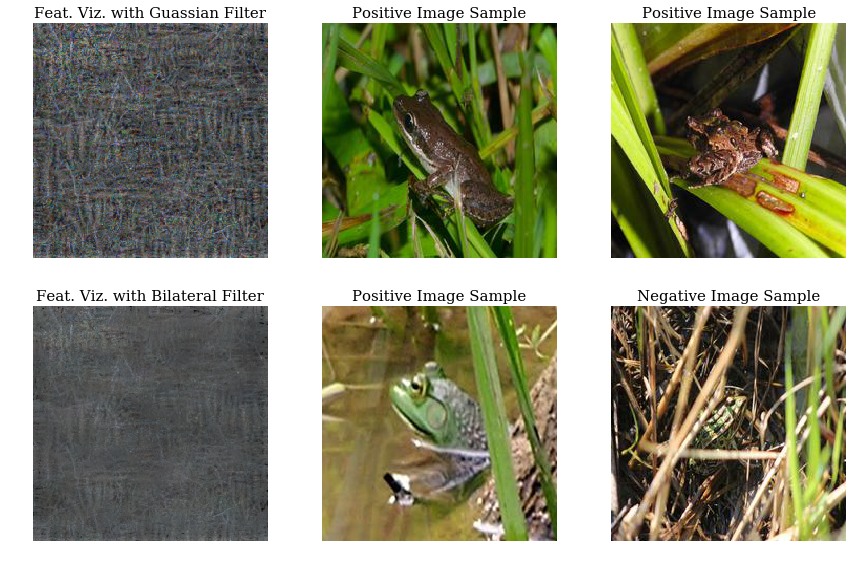

In [163]:
plt.figure(figsize=(12,8))

plt.subplot(2,3,1)
plt.title('Feat. Viz. with Guassian Filter', fontproperties=font)
plt.imshow(trim(PIL.Image.open('res50_l4_3_conv1_channel_355_raw_feat_viz.png')))
plt.axis('off')

plt.subplot(2,3,4)
plt.title('Feat. Viz. with Bilateral Filter', fontproperties=font)
plt.imshow(trim(PIL.Image.open('res50_l4_3_conv1_channel_355_bilateral_filter_feat_viz.png')))
plt.axis('off')

for i, idx in zip([2,3,5,6],[1322, 986,1276, 197]):
    plt.subplot(2,3,i)
    fname = trainset.imgs[idx][0]
    print(fname)
    plt.imshow(PIL.Image.open(fname))
    if i < 6:
        plt.title('Positive Image Sample', fontproperties=font)
    else:
        plt.title('Negative Image Sample', fontproperties=font)
    plt.axis('off')
# plt.suptitle('High Level Feature Amplified by Attention',fontsize=15, fontproperties=font)
plt.tight_layout()
print("Visualization res5c_branch2a")
plt.savefig('channel_355_final.png')

../data/train/2648/56f5b35b2183adbe111ac50cf5955df8.jpg
../data/train/2659/d524808402d43a174415fb2fd9bb0d7b.jpg
../data/train/2679/b67c4424ea5424682f40ec224d803e1c.jpg
../data/train/2684/b8502e941586cf48263d885f30925810.jpg


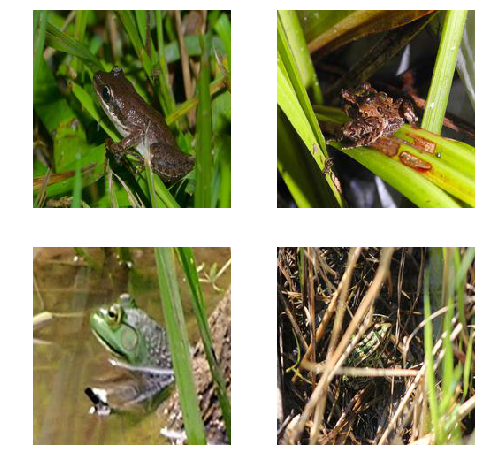

In [81]:
plt.figure(figsize=(8,8))
for i, idx in enumerate([1322, 986,1276, 197]):
    plt.subplot(2,2,i+1)
    fname = trainset.imgs[idx][0]
    print(fname)
    plt.imshow(PIL.Image.open(fname))
    plt.axis('off')

../data/train/2684/504246c934b78455b889cb619bc78004.jpg
../data/train/2728/05aa69a4011328825af22a0f9908a5c9.jpg
../data/train/2634/4abad7190727e98b3965890cf6e8f2d0.jpg
../data/train/2720/7cddd79c8b0b7defc0358e7d2faa863f.jpg
../data/train/2667/66661d3f56f4f591abed88d6de4b3f1b.jpg
../data/train/2629/17bd64dafd28d61cf240175c7d5326ce.jpg
../data/train/2715/9c63158dc5104aaa11f85374de4e7179.jpg
../data/train/2627/dcf92b00805fd39d03b9f88b46696c3d.jpg
../data/train/2680/92aaac0896bed1b4f5e6dd227b099ff2.jpg
../data/train/2686/b712d7a07b5f66dc69169c696a9fadc8.jpg
../data/train/2632/7f983ad0b2e908522400650e0303473e.jpg
../data/train/2697/65835a99f476389f4d20810a7dc15e82.jpg
../data/train/2641/09ef0156f2dc190aeb3f20cc10ae10e6.jpg
../data/train/2720/4f4cd5d34dfe3937e702ca5a60641212.jpg
../data/train/2680/83256b9c99ff3da0af012467d366d943.jpg
../data/train/2734/e385ab21f7a1b600fc0be3850677d962.jpg
../data/train/2739/9df7a8cb54c24ce371706bd7f887982a.jpg
../data/train/2649/b6ec0b2545f62290a6e6b0c4c0fa4

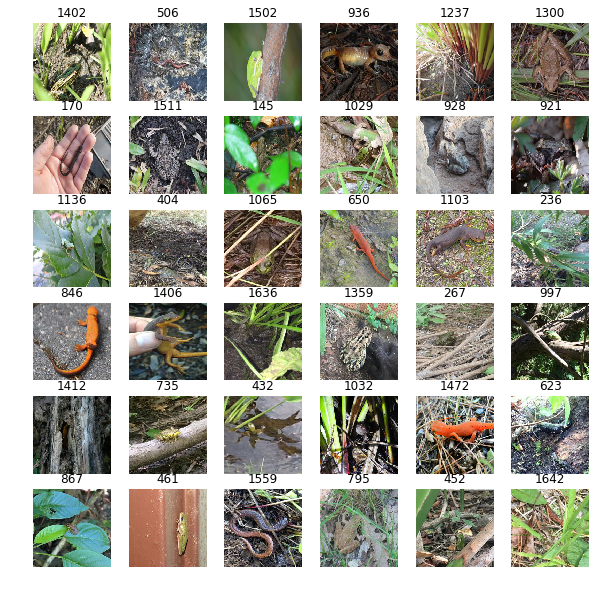

In [107]:
filt_23 = all_act[:,2,...]
l1_norms = np.array([filt_23[i].norm(p=1) for i in range(len(all_act))])
plt.figure(figsize=(10,10))
# for i, idx in enumerate(np.argsort(l1_norms)[-36:]):
#     plt.subplot(6,6,i+1)
#     plt.title(idx)
#     plt.imshow(PIL.Image.open(trainset.imgs[idx][0]))
#     plt.axis('off')
    
classes = []
# plt.figure(figsize=(10,10))
for i, idx in enumerate(np.argsort(l1_norms)[-36:]):
    plt.subplot(6,6,i+1)
    plt.title(idx)
    print(trainset.imgs[idx][0])
    classes.append(int(trainset.imgs[idx][0].replace('../data/train/','').split('/')[0]))
    plt.imshow(PIL.Image.open(trainset.imgs[idx][0]))
    plt.axis('off')
print(len(np.unique(np.array(classes))))

In [67]:
c_510_idx = np.argsort(l1_norms)[-36:][[15, 18, 28, 22]]

../data/train/2738/84d5ea8a1df55c6ff0b127d98c53a44e.jpg
../data/train/2734/82c964b6032121432d9540d55493baa9.jpg
../data/train/2739/9df7a8cb54c24ce371706bd7f887982a.jpg
../data/train/2649/b6ec0b2545f62290a6e6b0c4c0fa497b.jpg
Visualization res5c_branch2a


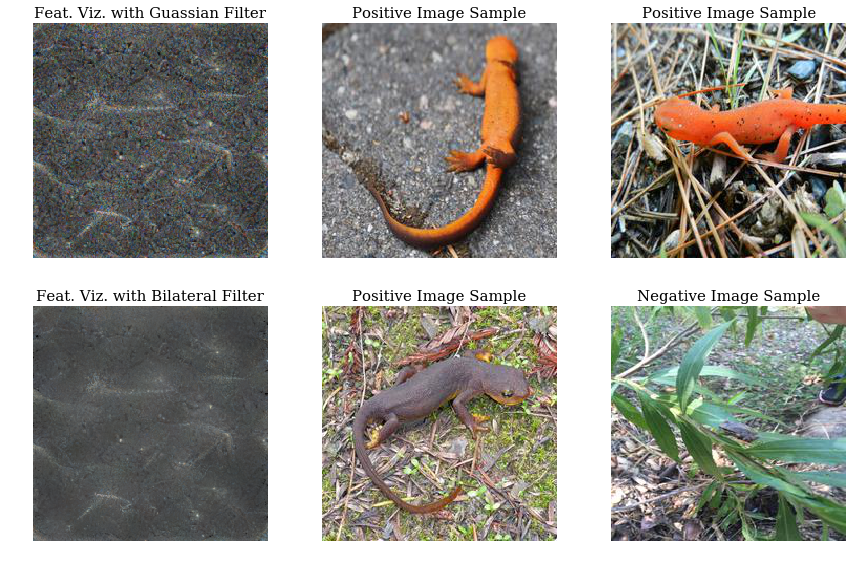

In [159]:
plt.figure(figsize=(12,8))

plt.subplot(2,3,1)
plt.title('Feat. Viz. with Guassian Filter', fontproperties=font)
plt.imshow(trim(PIL.Image.open('res50_l4_3_conv1_channel_510_raw_feat_viz.png')))
plt.axis('off')

plt.subplot(2,3,4)
plt.title('Feat. Viz. with Bilateral Filter', fontproperties=font)
plt.imshow(trim(PIL.Image.open('res50_l4_3_conv1_channel_510_bilateral_filter_feat_viz.png')))
plt.axis('off')

for i, idx in zip([2,3,5,6],[846, 1472, 1103, 236]):
    plt.subplot(2,3,i)
    fname = trainset.imgs[idx][0]
    print(fname)
    plt.imshow(PIL.Image.open(fname))
    if i < 6:
        plt.title('Positive Image Sample', fontproperties=font)
    else:
        plt.title('Negative Image Sample', fontproperties=font)
    plt.axis('off')
# plt.suptitle('High Level Feature Amplified by Attention',fontsize=15, fontproperties=font)
plt.tight_layout()
print("Visualization res5c_branch2a")
plt.savefig('channel_510_final.png')

Wondering if there's any weak features

In [87]:
summed = (attn_model.layer4[2].conv1.attn_weights.squeeze()).sum(1).data.cpu().numpy()

In [89]:
np.argmin(summed)

370

In [90]:
img = get_blank_img()
filt = 370
eps = 1e-8
for i in range(20):    
    res = to_conv(img)[0,filt]
    objective = res.mean() 
    objective.backward()
    img.grad /= img.grad.std() + eps
    img.data += img.grad.data
    if i < 19:
        img = blur(img, 15/(i+1), 15/(i+1))
    else:
        img = blur(img, 1, 0.8)

(-0.5, 499.5, 499.5, -0.5)

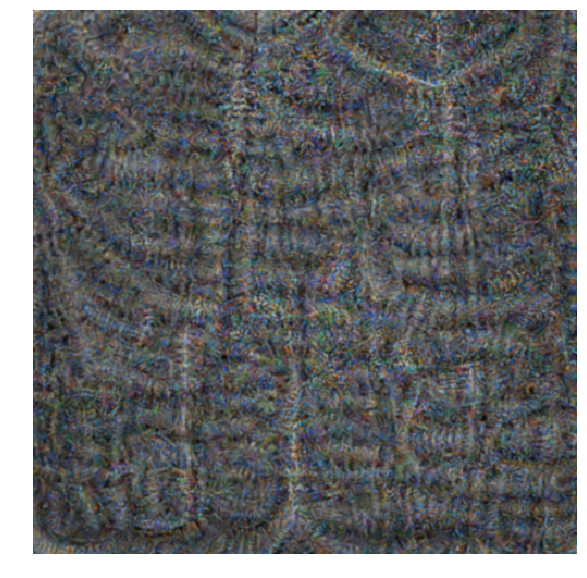

In [91]:
plt.figure(figsize=(10,10))
recreated = recreate_image(img)
plt.imshow(recreated)
plt.axis('off')

In [92]:
max_iter = 50
least_act = []
for i, (input, _) in enumerate(trainloader):
    out = to_conv(Variable(input).cuda())
    act = out[:,370]
    least_act.append(act.data)
    if i > max_iter:
        break

In [93]:
least_act = torch.cat(least_act)

In [94]:
least_act.shape

torch.Size([1664, 7, 7])

In [95]:
least_act_norms = np.array([least_act[i].norm(p=2) for i in range(len(least_act))])

../data/train/2601/c94f260e7559314e62dc6c0de76a7f48.jpg
../data/train/2601/e7ee77dcfabb7288db1a1cb9236558e5.jpg
../data/train/2629/fde7f8669c9ab3bc52e075d82ac725a3.jpg
../data/train/2741/84da37ca75e194fba2932f049cad2de0.jpg
../data/train/2739/d3cb8f4ced81a078618ac9a7c54e240e.jpg
../data/train/2602/0df5ac3345c7e1c0b96d009101f5c038.jpg
../data/train/2634/1a478bd49e95a1a7a7169166f7c9bb13.jpg
../data/train/2720/8a2f333c82cbc437a534860a3079d0c0.jpg
../data/train/2690/25ed78935913d318ed6e30ab30cc37b0.jpg
../data/train/2607/118369b96aece37402c0e8e9fcf0aab3.jpg
../data/train/2640/3a249cf065c03910e81f411c91391cb9.jpg
../data/train/2705/4904583b4df103dbca701b2ee3363f19.jpg
../data/train/2734/82c964b6032121432d9540d55493baa9.jpg
../data/train/2736/5cd42c9298c6a84837da0156e0ca68bf.jpg
../data/train/2734/596ddee73bcb77a87c2fcad4ced60ef4.jpg
../data/train/2646/3e75cd81347f3299ea6a0713cce25c6c.jpg
../data/train/2734/92ef0bfb6933c63fc8867b4c68e8b81f.jpg
../data/train/2734/e1c7193af10c959b51479354264bc

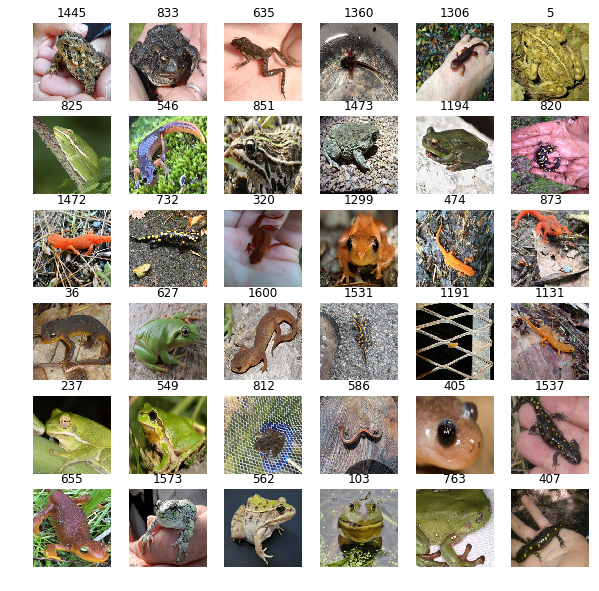

In [103]:
classes = []
plt.figure(figsize=(10,10))
for i, idx in enumerate(np.argsort(least_act_norms)[-36:]):
    plt.subplot(6,6,i+1)
    plt.title(idx)
    print(trainset.imgs[idx][0])
    classes.append(int(trainset.imgs[idx][0].replace('../data/train/','').split('/')[0]))
    plt.imshow(PIL.Image.open(trainset.imgs[idx][0]))
    plt.axis('off')
print(len(np.unique(np.array(classes))))

In [102]:
len(np.unique(np.array(classes)))

23

In [152]:
from matplotlib.font_manager import FontProperties
font = FontProperties()
font.set_family('serif')
font.set_variant('normal')
font.set_size(15)

In [23]:
resnet = resnet.eval().cuda()

In [24]:
from util import preprocess_image, recreate_image
def get_blank_img():
    return preprocess_image(np.random.randn(500,500, 3))

In [25]:
childs = list(resnet.children())

In [26]:
# to_conv = nn.Sequential(
#     *(childs[:5] 
#       + list(childs[5].children())[:2] 
#       + [list(childs[5].children())[2].conv1]))

In [27]:
# to_conv = resnet.conv1

In [ ]:
def blur(img, sigma, c_sigma):
    out = recreate_image(img)
    out = gaussian_filter(out, [sigma, sigma, c_sigma])
#     out = cv2.bilateralFilter(out, 9, sigma, sigma)
    return preprocess_image(out)

In [123]:
img = get_blank_img()
filt = 510
eps = 1e-8
for i in range(20):    
    res = to_conv(img)[0,filt]
    objective = res.mean() 
    objective.backward()
    img.grad /= img.grad.std() + eps
    img.data += img.grad.data
    if i < 19:
        img = blur(img, 15/(i+1), 15/(i+1))
    else:
        img = blur(img, 1, 0.8)

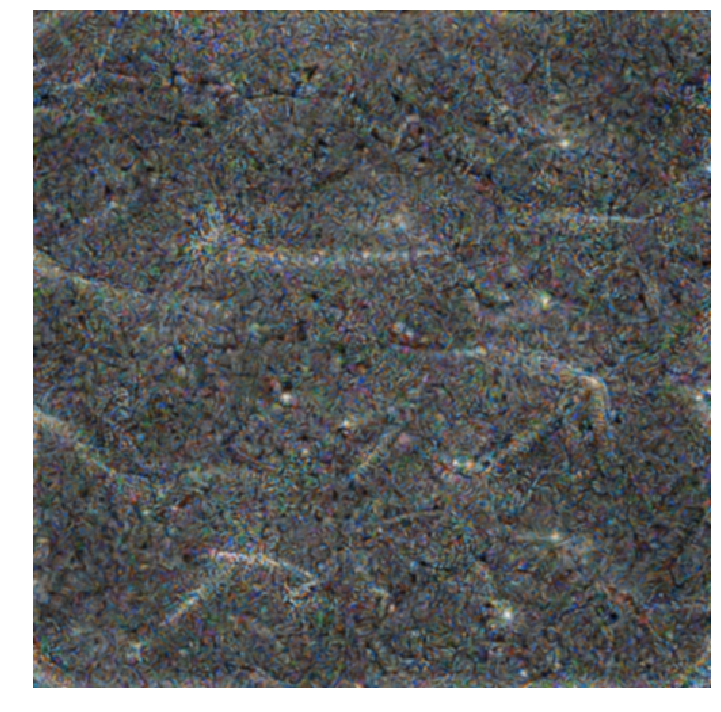

In [124]:
plt.figure(figsize=(10,10))
recreated = recreate_image(img)
plt.imshow(recreated)
plt.axis('off')
plt.tight_layout()
plt.savefig('res50_l4_3_conv1_channel_510_raw_feat_viz.png')

In [125]:
from skimage.restoration import denoise_bilateral

In [126]:
bil = denoise_bilateral(recreated, sigma_color=0.05, sigma_spatial=15,
                multichannel=True)

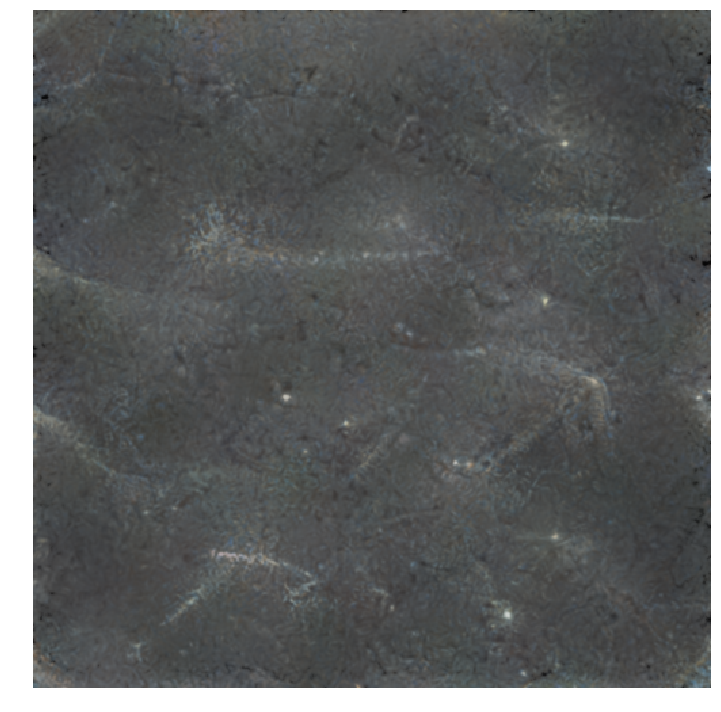

In [127]:
plt.figure(figsize=(10,10))
plt.imshow(bil)
plt.axis('off')
plt.tight_layout()
plt.savefig('res50_l4_3_conv1_channel_510_bilateral_filter_feat_viz.png')

In [ ]:
[438, 355, 510]

In [132]:
from PIL import Image, ImageChops

def trim(im):
    bg = Image.new(im.mode, im.size, im.getpixel((0,0)))
    diff = ImageChops.difference(im, bg)
    diff = ImageChops.add(diff, diff, 2.0, -100)
    bbox = diff.getbbox()
    if bbox:
        return im.crop(bbox)

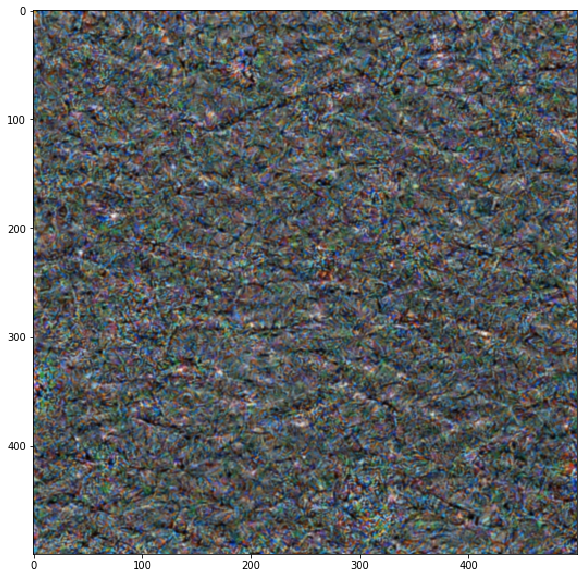

In [41]:
img = get_blank_img()
filt = 438
eps = 1e-8
for i in range(20):    
    res = to_conv(img)[0,filt]
    objective = res.mean() 
    objective.backward()
    img.grad /= img.grad.std() + eps
    img.data += img.grad.data
    if i < 19:
        img = blur(img, 10/(i+1), 10/(i+1))
    else:
        img = blur(img, 0.8, 0.7)
plt.figure(figsize=(10,10))
plt.imshow(recreate_image(img))

In [42]:
bil_438 = denoise_bilateral(recreate_image(img), sigma_color=0.05, sigma_spatial=15,
                multichannel=True)

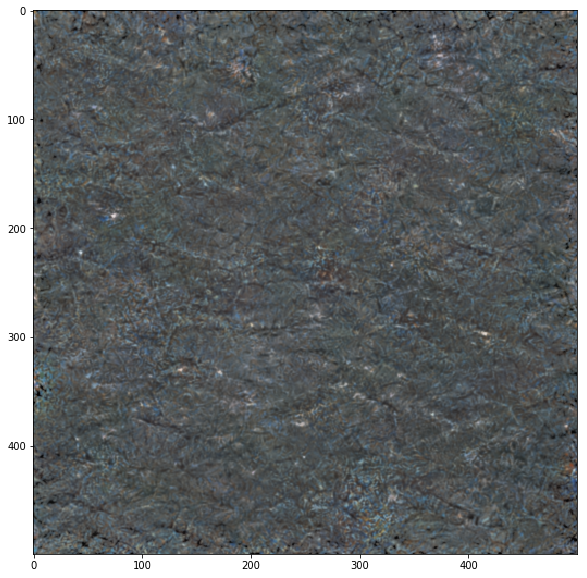

In [44]:
plt.figure(figsize=(10,10))
plt.imshow(bil_438)

In [128]:
img = get_blank_img()
filt = 355
eps = 1e-8
for i in range(20):    
    res = to_conv(img)[0,filt]
    objective = res.mean() 
    objective.backward()
    img.grad /= img.grad.std() + eps
    img.data += img.grad.data
    if i < 19:
        img = blur(img, 15/(i+1), 15/(i+1))
    else:
        img = blur(img, 1, 0.8)

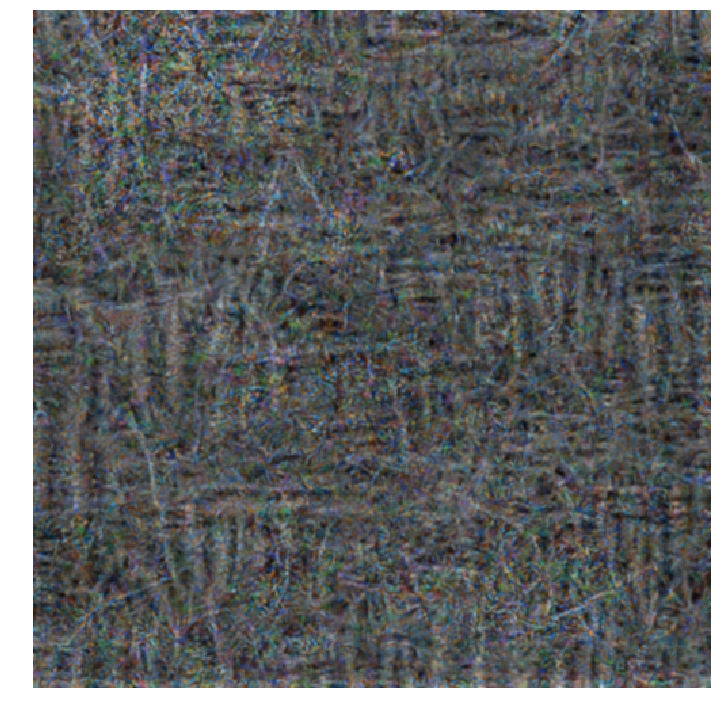

In [129]:
plt.figure(figsize=(10,10))
plt.imshow(recreate_image(img))
plt.axis('off')
plt.tight_layout()
plt.savefig('res50_l4_3_conv1_channel_355_raw_feat_viz.png')

In [161]:
bil_355 = denoise_bilateral(recreate_image(img), sigma_color=0.05, sigma_spatial=15,
                multichannel=True)

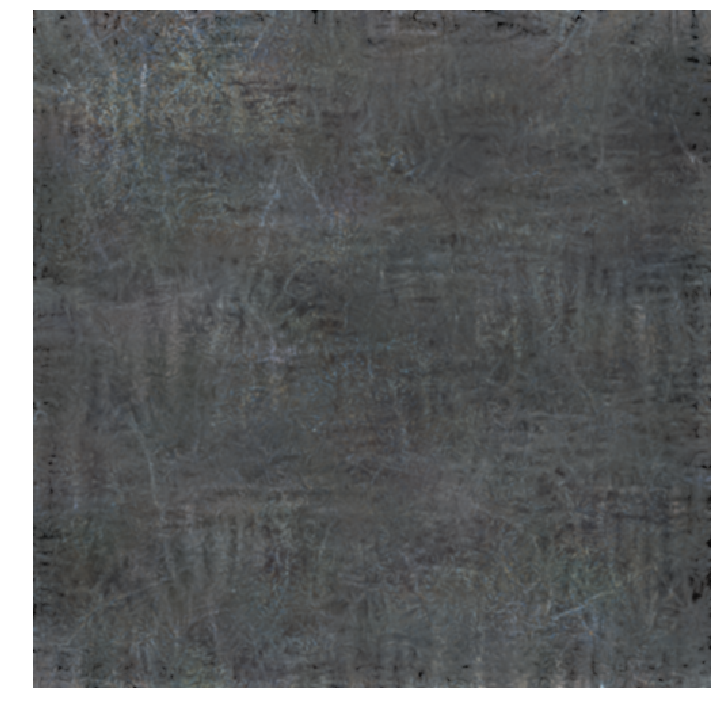

In [162]:
plt.figure(figsize=(10,10))
plt.imshow(bil_355)
plt.axis('off')
plt.tight_layout()
plt.savefig('res50_l4_3_conv1_channel_355_bilateral_filter_feat_viz.png')